In [13]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.cluster as cluster
import sklearn.manifold as manifold
import pandas as pd

In [14]:
dataset_name = "mnist_pca_100"

dataset = pd.read_csv("/Users/bartoszminch/Documents/Repositories/dataset_viskit/datasets/{}_data.csv".format(dataset_name), header=None, index_col=False)
labels = pd.read_csv("/Users/bartoszminch/Documents/Repositories/dataset_viskit/datasets/{}_labels.csv".format(dataset_name), header=None, index_col=False)

def plot_2d_scatter(X, Y, labels):
    fig, plot = plt.subplots()
    fig.set_size_inches(16, 16)

    unique = list(set(labels))
    colors = [plt.cm.jet(float(i) / max(unique)) for i in unique]

    for i, u in enumerate(unique):
        xi = [X[j] for j in range(len(X)) if labels[j] == u]
        yi = [Y[j] for j in range(len(X)) if labels[j] == u]
        plt.scatter(xi, yi, color=colors[i], label=str(u), s=2)

    plot.set_xticks(())
    plot.set_yticks(())

    plt.tight_layout()
    plt.legend()
    plt.show()

In [15]:
# # Uncomment if datasets already calculated and you only want to change metrics/visualizations
# ivhd_results = []
# largevis_results = []
#
# tsne_embedded = np.loadtxt("./embeddings/{}/{}.txt".format(dataset_name, "tsne_embedding_original_dataset"), delimiter=",")
# class_tsne = np.loadtxt("./embeddings/{}/{}.txt".format(dataset_name, "tsne_embedding_local_centroids"), delimiter=",")
# global_cluster_tsne = np.loadtxt("./embeddings/{}/{}.txt".format(dataset_name, "tsne_embedding_global_centroids"), delimiter=",")
# merged_cluster_tsne = np.loadtxt("./embeddings/{}/{}.txt".format(dataset_name, "tsne_embedding_merged_centroids"), delimiter=",")
#
# ivhd = np.loadtxt("./embeddings/{}/{}.txt".format(dataset_name, "ivhd"), delimiter=",")
# ivhd_local = np.loadtxt("./embeddings/{}/{}.txt".format(dataset_name, "ivhd_(lc)"), delimiter=",")
# ivhd_global = np.loadtxt("./embeddings/{}/{}.txt".format(dataset_name, "ivhd_(gc)"), delimiter=",")
# ivhd_merged = np.loadtxt("./embeddings/{}/{}.txt".format(dataset_name, "ivhd_(lc+gc)"), delimiter=",")
#
# ivhd_results.append(ivhd)
# ivhd_results.append(ivhd_local)
# ivhd_results.append(ivhd_global)
# ivhd_results.append(ivhd_merged)
#
# largevis = np.loadtxt("./embeddings/{}/{}.txt".format(dataset_name, "largevis"), delimiter=",")
# largevis_local = np.loadtxt("./embeddings/{}/{}.txt".format(dataset_name, "largevis_(lc)"), delimiter=",")
# largevis_global = np.loadtxt("./embeddings/{}/{}.txt".format(dataset_name, "largevis_(gc)"), delimiter=",")
# largevis_merged = np.loadtxt("./embeddings/{}/{}.txt".format(dataset_name, "largevis_(lc+gc)"), delimiter=",")
#
# largevis_results.append(largevis)
# largevis_results.append(largevis_local)
# largevis_results.append(largevis_global)
# largevis_results.append(largevis_merged)
#
# ivhd_names = [
#     "IVHD",
#     "IVHD (lc)",
#     "IVHD (gc)",
#     "IVHD (lc+gc)",
# ]
#
# largevis_names = [
#     "LargeVis",
#     "LargeVis (lc)",
#     "LargeVis (gc)",
#     "LargeVis (lc+gc)",
# ]

In [16]:
clusters_per_class = 100
cluster_centers = {
    i: cluster.KMeans(n_clusters=clusters_per_class).fit(
        dataset[labels.iloc[:, 0] == i]
    ).cluster_centers_ for i in range(10)
}

class_embedded = np.concatenate(tuple(
    np.linalg.norm(dataset[labels.iloc[:, 0] == i].to_numpy()[:, None, :] - cluster_centers[i][None, :, :], axis=-1) for i in range(10)
))
pd.DataFrame(class_embedded).to_csv('./data/{}_local_embedded.csv'.format(dataset_name), header=False, index=False)

labels_sorted_by_local = np.sort(labels.to_numpy().flatten())
dataset_sorted_by_local = np.concatenate(tuple(
    dataset[labels.iloc[:, 0] == i] for i in range(10)
))

global_clusters_no = 100
global_cluster_centers = cluster.KMeans(n_clusters=global_clusters_no).fit(dataset).cluster_centers_
global_embedded = np.linalg.norm(dataset.to_numpy()[:, None, :] - global_cluster_centers[None, :, :], axis=-1)
pd.DataFrame(global_embedded).to_csv('./data/{}_global_embedded.csv'.format(dataset_name), header=False, index=False, float_format='%.2e')

merged_embedded = np.concatenate((class_embedded, global_embedded), axis=1)
pd.DataFrame(merged_embedded).to_csv('./data/{}_merged_embedded.csv'.format(dataset_name), header=False, index=False, float_format='%.2e')

/Users/bartoszminch/miniconda3/envs/viskit/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/bartoszminch/miniconda3/envs/viskit/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


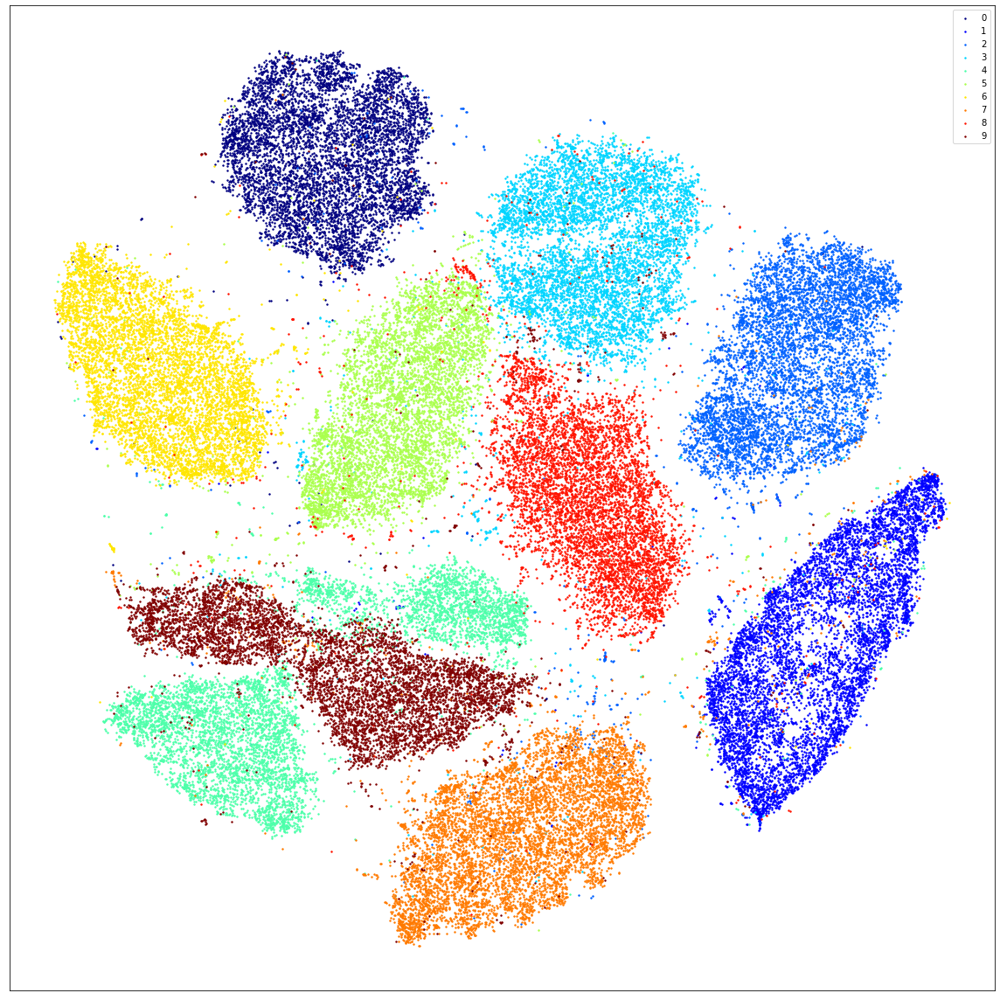

In [17]:
perplexity = 120

tsne_embedded = manifold.TSNE(n_components=2, perplexity=perplexity).fit_transform(dataset)
np.savetxt("./embeddings/{}/{}.txt".format(dataset_name, "tsne_embedding_original_dataset"), tsne_embedded, delimiter=",", fmt='%.2e')
plot_2d_scatter(tsne_embedded[:, 0], tsne_embedded[:, 1], labels.to_numpy().flatten())

/Users/bartoszminch/miniconda3/envs/viskit/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/bartoszminch/miniconda3/envs/viskit/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


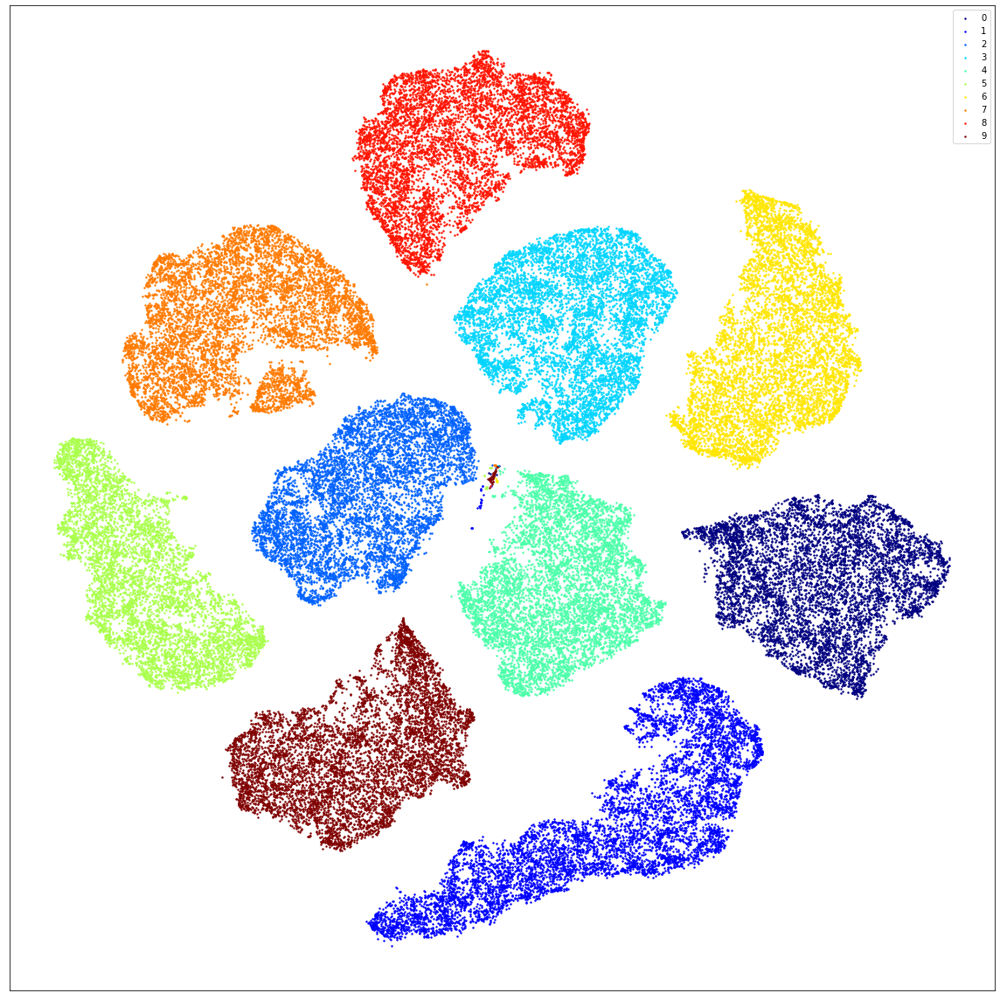

In [18]:
class_tsne = manifold.TSNE(n_components=2, perplexity=perplexity).fit_transform(class_embedded)
np.savetxt("./embeddings/{}/{}.txt".format(dataset_name, "tsne_embedding_local_centroids"), class_tsne, delimiter=",", fmt='%.2e')
plot_2d_scatter(class_tsne[:, 0], class_tsne[:, 1], labels_sorted_by_local)

/Users/bartoszminch/miniconda3/envs/viskit/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/bartoszminch/miniconda3/envs/viskit/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


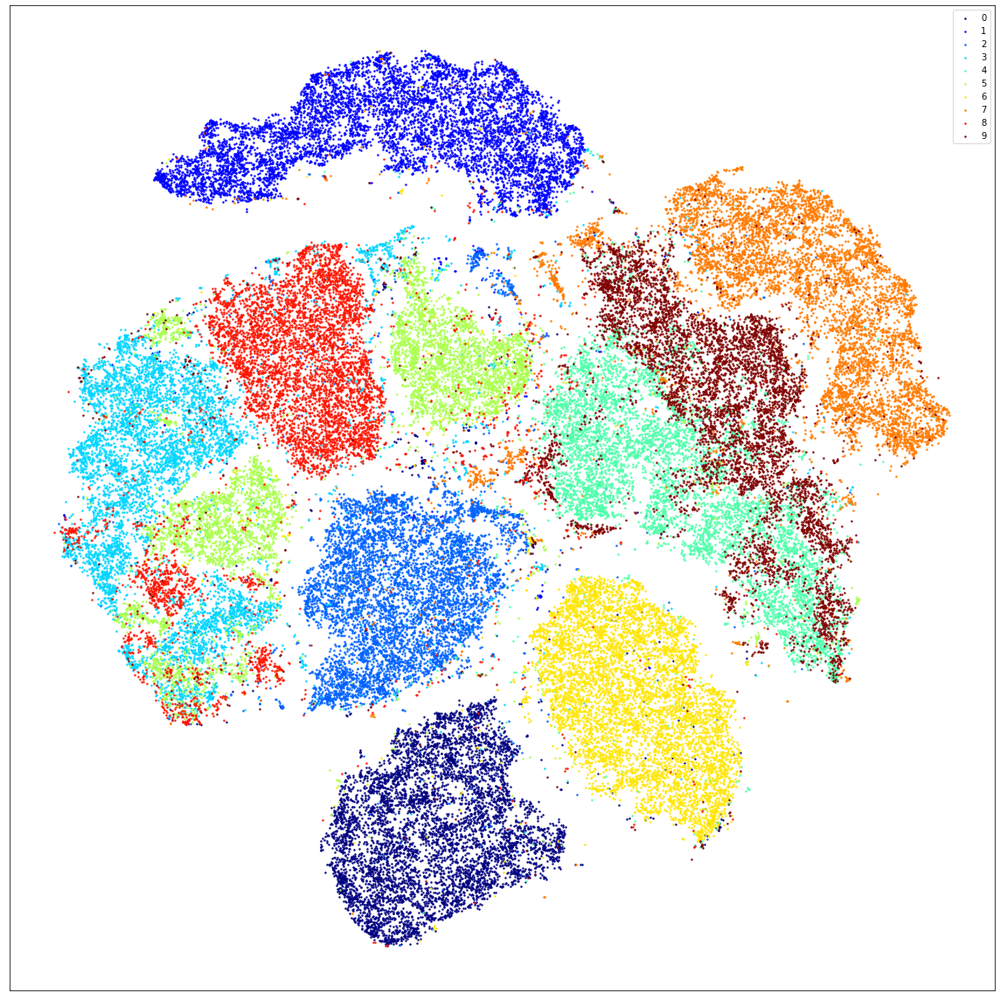

In [19]:
global_cluster_tsne = manifold.TSNE(n_components=2, perplexity=perplexity).fit_transform(global_embedded)
np.savetxt("./embeddings/{}/{}.txt".format(dataset_name, "tsne_embedding_global_centroids"), global_cluster_tsne, delimiter=",", fmt='%.2e')
plot_2d_scatter(global_cluster_tsne[:, 0], global_cluster_tsne[:, 1], labels.to_numpy().flatten())

/Users/bartoszminch/miniconda3/envs/viskit/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/bartoszminch/miniconda3/envs/viskit/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


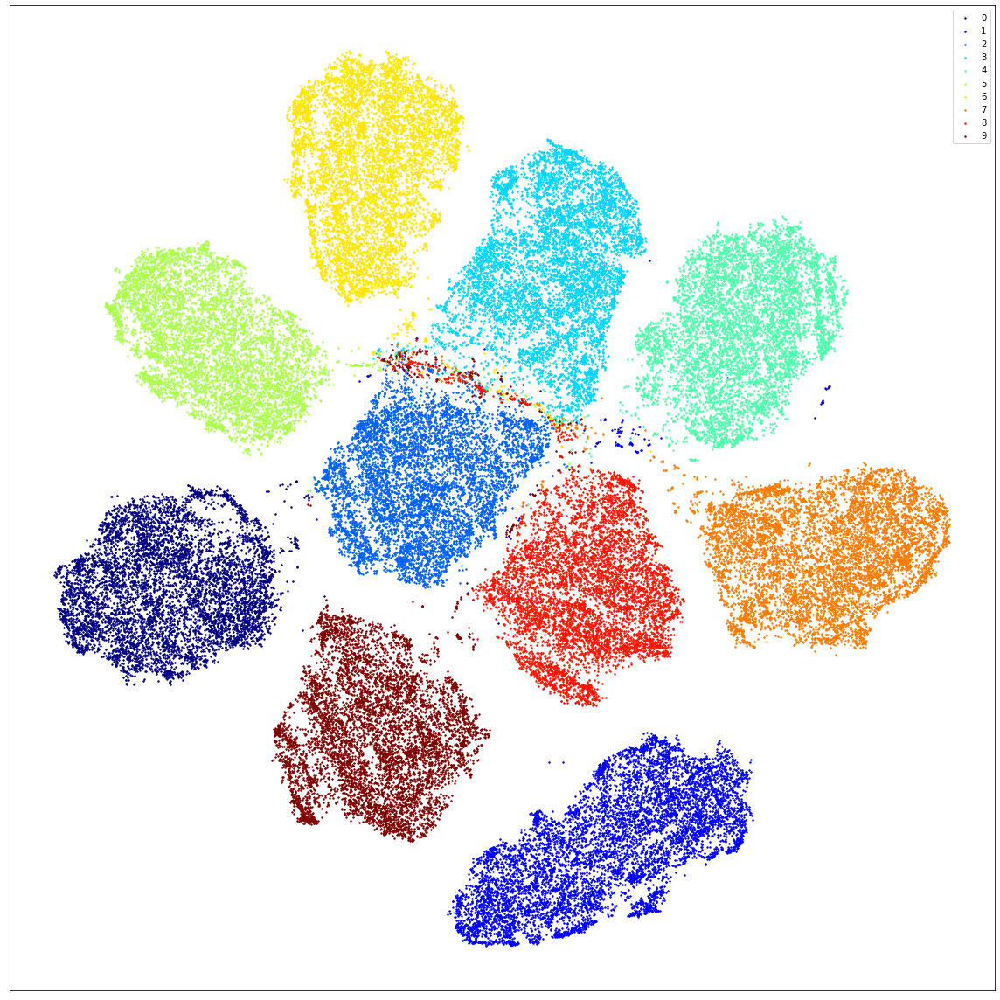

In [20]:
merged_cluster_tsne = manifold.TSNE(n_components=2, perplexity=perplexity).fit_transform(merged_embedded)
np.savetxt("./embeddings/{}/{}.txt".format(dataset_name, "tsne_embedding_merged_centroids"), merged_cluster_tsne, delimiter=",", fmt='%.2e')
plot_2d_scatter(merged_cluster_tsne[:, 0], merged_cluster_tsne[:, 1], labels_sorted_by_local)

In [21]:
import struct

import faiss
import sys
import pandas as pd
import numpy as np

from datetime import datetime
from numpy import sqrt


class FaissGenerator:
    def __init__(self, csv_file: str, cosine_metric: bool = False):
        self.indexes = []
        self.distances = []
        self.nn = None
        self.cosine_metric = cosine_metric

        with open(csv_file) as csv_file:
            df = pd.read_csv(csv_file, delimiter=",", header=None, index_col=False)
            self.N = len(df.axes[0])
            self.M = len(df.axes[1]) - 1

        if self.cosine_metric:
            # if cosine - we have to normalize the dataset
            self.X = df.to_numpy(dtype="float").astype("float32")[:, 1:]
            norm = np.linalg.norm(self.X, axis=1).reshape(-1, 1)
            self.X = np.divide(self.X, norm)
        else:
            self.X = df.to_numpy(dtype="float").astype("float32")[:, 1:]

        self.X = self.X.copy(order="C")

    def run(self, nn: int = 100):
        self.nn = nn

        index_flat = None
        if self.cosine_metric:
            quantizer = faiss.IndexFlatIP(self.M)
            index_flat = faiss.IndexIVFFlat(quantizer, self.M, int(sqrt(self.N)))
            index_flat.nprobe = 10
        else:
            quantizer = faiss.IndexFlatL2(self.M)
            index_flat = faiss.IndexIVFFlat(quantizer, self.M, int(sqrt(self.N)))

        # gpu_index_flat = faiss.index_cpu_to_gpu(res, 0, index_flat)
        assert not index_flat.is_trained
        index_flat.train(self.X)
        assert index_flat.is_trained

        index_flat.add(self.X)

        start = datetime.now()
        print("Searching...")
        index_flat.nprobe = 10
        self.distances, self.indexes = index_flat.search(self.X, nn + 1)
        print("Finished.")

        print(datetime.now() - start, file=sys.stderr)

        # normalize distances
        norm = np.linalg.norm(self.X)
        self.distances = np.divide(self.distances, norm)

        return self.distances, self.indexes

    def save_to_binary_file(self, output_file_path):
        with open(output_file_path, "wb") as f:
            f.write("{};{};{}\n".format(self.N, self.nn, 8).encode("ascii"))
            f.write(0x01020304 .to_bytes(8, byteorder="little"))
            for i in range(0, len(self.indexes)):
                for j in range(0, len(self.indexes[i])):
                    if i != self.indexes[i][j]:
                        f.write(int(self.indexes[i][j]).to_bytes(8, byteorder="little"))
                        f.write(bytearray(struct.pack("f", self.distances[i][j])))
            f.close()

    def save_to_text_file(self, output_file_path):
        with open(output_file_path, "w") as f:
            f.write(str(self.N) + "\n")
            f.write(str(self.nn) + "\n")
            f.write("0x01020304" + "\n")
            for i in range(0, len(self.indexes)):
                for j in range(0, len(self.indexes[i])):
                    if i != self.indexes[i][j]:
                        f.write(
                            "{} {} {}\n".format(
                                i, self.indexes[i][j], self.distances[i][j]
                            )
                        )

centroid_datasets = [
    "{}_local_embedded".format(dataset_name),
    "{}_global_embedded".format(dataset_name),
    "{}_merged_embedded".format(dataset_name)
]

for centroid_dataset in centroid_datasets:
    dataset_path = "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}.csv".format(centroid_dataset)
    generator = FaissGenerator(dataset_path, cosine_metric=False)
    dist, ind = generator.run(nn=100)
    generator.save_to_binary_file("./data/{}_euclidean.bin".format(centroid_dataset))

Searching...
Finished.


0:00:01.086397


Searching...
Finished.


0:00:01.226784


Searching...
Finished.


0:00:04.974996


In [22]:
ivhd_const_args = {
    'dir': "../viskit_offline",
    'labels_csv': "/Users/bartoszminch/Documents/Repositories/dataset_viskit/datasets/{}_labels.csv".format(dataset_name),
    'output': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}.txt".format(dataset_name),
    'iter': 3500,
    'nn': 2,
    'rn': 1,
    'bd': 1, # binaryDistances
    'rns': 0, # reverseNeighborsSteps
    'rnc': 0, # reverseNeighborsCount
    'l1s': 10, # l1Steps
    'optimizer': "force-directed"
}

ivhd_args = [
    {'gp': "/Users/bartoszminch/Documents/Repositories/dataset_viskit/graphs/{}_euclidean.bin".format(dataset_name), 'dataset_csv': "/Users/bartoszminch/Documents/Repositories/dataset_viskit/datasets/{}_data.csv".format(dataset_name)},
    {'gp': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}_local_embedded_euclidean.bin".format(dataset_name), 'dataset_csv': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}_local_embedded.csv".format(dataset_name)},
    {'gp': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}_global_embedded_euclidean.bin".format(dataset_name), 'dataset_csv': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}_global_embedded.csv".format(dataset_name)},
    {'gp': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}_merged_embedded_euclidean.bin".format(dataset_name), 'dataset_csv': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}_merged_embedded.csv".format(dataset_name)},
]

ivhd_names = [
    "IVHD",
    "IVHD (lc)",
    "IVHD (gc)",
    "IVHD (lc+gc)"
]

def get_ivhd_result(output_file) -> pd.DataFrame:
    df_ivhd = pd.read_csv(output_file, header=None)
    x_ivhd = df_ivhd.loc[:, '0':'1'].values
    return x_ivhd

import os

ivhd_results = []

i = 0
for args in ivhd_args:
    gp_arg = args['gp']
    dataset_arg = args['dataset_csv']

    command = '{dir} "{data_csv}" "{labels_csv}" "{gp}" {output} {iter} {nn} {rn} {bd} {rns} {rnc} {l1s} "{optimizer}"'.format(
        dir = ivhd_const_args['dir'],
        data_csv = dataset_arg,
        labels_csv = ivhd_const_args['labels_csv'],
        gp = gp_arg,
        output = ivhd_const_args['output'],
        iter = ivhd_const_args['iter'],
        nn = ivhd_const_args['nn'],
        rn = ivhd_const_args['rn'],
        bd = ivhd_const_args['bd'],
        rns = ivhd_const_args['rns'],
        rnc = ivhd_const_args['rnc'],
        l1s = ivhd_const_args['l1s'],
        optimizer = ivhd_const_args['optimizer'],
    )

    os.system(command)

    res = get_ivhd_result(ivhd_const_args['output'])
    np.savetxt("/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/embeddings/{}/{}.txt".format(dataset_name, ivhd_names[i].lower().replace(" ", "_")), res, delimiter=",", fmt='%.6e')
    ivhd_results.append(res)
    i += 1

[Info] [CSV Parser] Loading dataset from file: /Users/bartoszminch/Documents/Repositories/dataset_viskit/datasets/mnist_pca_100_data.csv
[Info] [CSV Parser] Loading labels from file: /Users/bartoszminch/Documents/Repositories/dataset_viskit/datasets/mnist_pca_100_labels.csv
[Info] [CSV Parser] Labels file passed.
[Info] [CSV Parser] Dataset size: 70000
[Info] [CSV Parser] Dataset dimensionality: 100
[Info] [CSV Parser] Number of classes in dataset: 10
[Info] [CSV Parser] Finished.
[Info] [Graph] Loading graph from cache...
[Info] [Graph] Using binary distances...
[Info] [Graph] Finished.
[Info] [kNN Generator] Determining random neighbors...
[Info] [kNN Generator] Finished.
[Info] [kNN Generator] Neighbors in graph: 210000
[Info] [CSV Parser] Loading dataset from file: /Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/mnist_pca_100_local_embedded.csv
[Info] [CSV Parser] Loading labels from file: /Users/bartoszminch/Documents/Repositories/dataset_viski

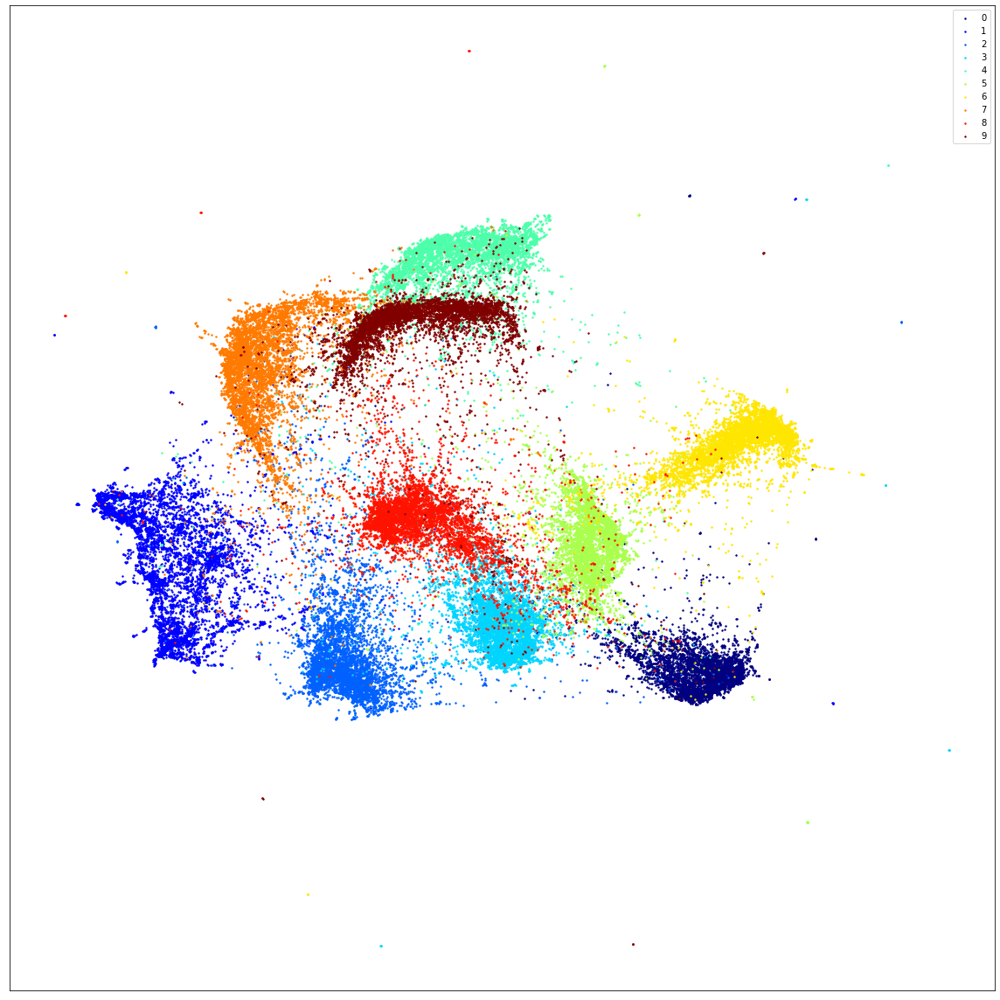

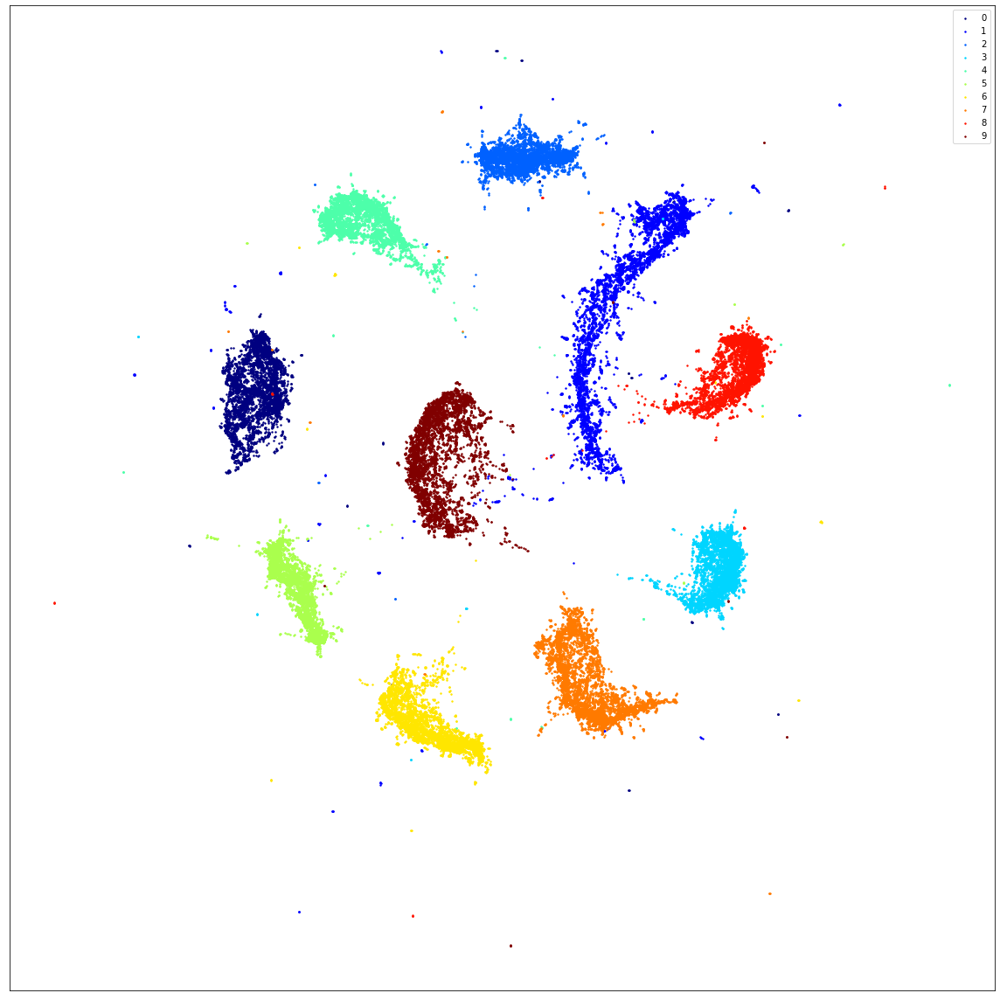

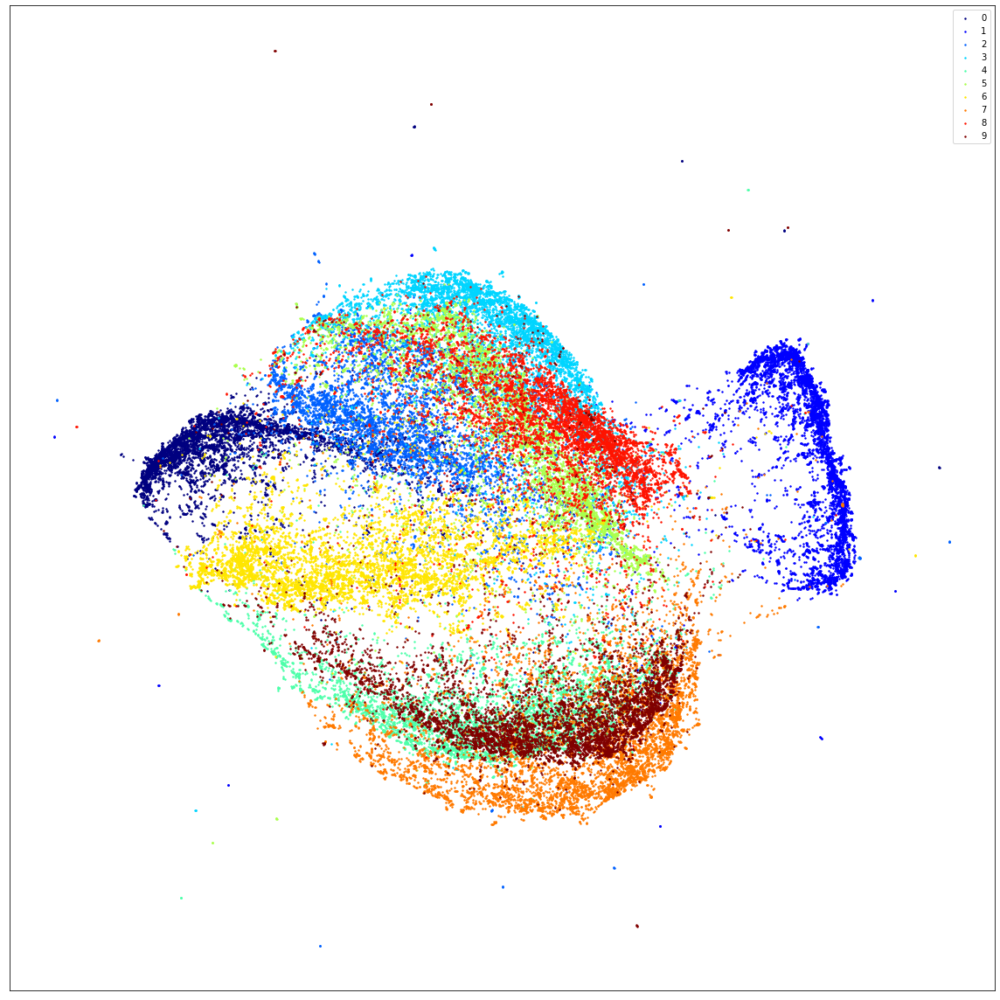

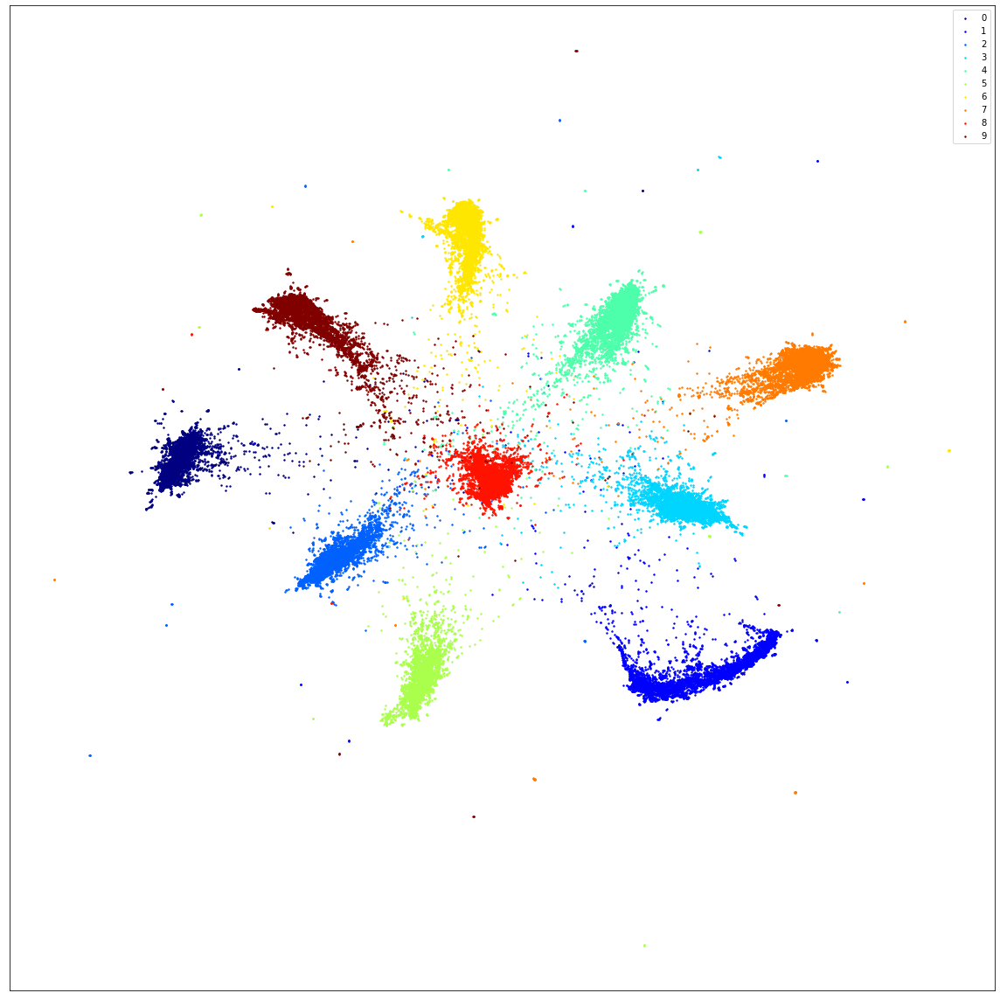

In [23]:
i = 0

labels_color = np.sort(labels.to_numpy().flatten())

for ivhd_result in ivhd_results:
    if "lc" in ivhd_names[i]:
        plot_2d_scatter(ivhd_result[:,0], ivhd_result[:,1], labels_color)
    else:
        plot_2d_scatter(ivhd_result[:,0], ivhd_result[:,1], labels.to_numpy().flatten())
    i += 1

In [24]:
largevis_const_args = {
    'dir': "../viskit_offline",
    'labels_csv': "/Users/bartoszminch/Documents/Repositories/dataset_viskit/datasets/{}_labels.csv".format(dataset_name),
    'output': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}.txt".format(dataset_name),
    'iter': 1,
    'nn': 30,
    'rn': 1,
    'bd': 1, # binaryDistances
    'rns': 0, # reverseNeighborsSteps
    'rnc': 0, # reverseNeighborsCount
    'l1s': 0, # l1Steps
    'optimizer': "largevis"
}

largevis_args = [
    {'gp': "/Users/bartoszminch/Documents/Repositories/dataset_viskit/graphs/{}_euclidean.bin".format(dataset_name), 'dataset_csv': "/Users/bartoszminch/Documents/Repositories/dataset_viskit/datasets/{}_data.csv".format(dataset_name)},
    {'gp': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}_local_embedded_euclidean.bin".format(dataset_name), 'dataset_csv': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}_local_embedded.csv".format(dataset_name)},
    {'gp': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}_global_embedded_euclidean.bin".format(dataset_name), 'dataset_csv': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}_global_embedded.csv".format(dataset_name)},
    {'gp': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}_merged_embedded_euclidean.bin".format(dataset_name), 'dataset_csv': "/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/data/{}_merged_embedded.csv".format(dataset_name)},
]

largevis_names = [
    "LargeVis",
    "LargeVis (lc)",
    "LargeVis (gc)",
    "LargeVis (lc+gc)"
]

def get_largevis_result(output_file) -> pd.DataFrame:
    df_ivhd = pd.read_csv(output_file, header=None)
    x_ivhd = df_ivhd.loc[:, '0':'1'].values
    return x_ivhd

import os

largevis_results = []

i = 0
for args in largevis_args:
    gp_arg = args['gp']
    dataset_arg = args['dataset_csv']

    command = '{dir} "{data_csv}" "{labels_csv}" "{gp}" {output} {iter} {nn} {rn} {bd} {rns} {rnc} {l1s} "{optimizer}"'.format(
        dir = largevis_const_args['dir'],
        data_csv = dataset_arg,
        labels_csv = largevis_const_args['labels_csv'],
        gp = gp_arg,
        output = largevis_const_args['output'],
        iter = largevis_const_args['iter'],
        nn = largevis_const_args['nn'],
        rn = largevis_const_args['rn'],
        bd = largevis_const_args['bd'],
        rns = largevis_const_args['rns'],
        rnc = largevis_const_args['rnc'],
        l1s = largevis_const_args['l1s'],
        optimizer = largevis_const_args['optimizer'],
    )

    os.system(command)

    res = get_largevis_result(largevis_const_args['output'])
    np.savetxt("/Users/bartoszminch/Documents/Repositories/viskit/python/experiments/cn_network/embeddings/{}/{}.txt".format(dataset_name, largevis_names[i].lower().replace(" ", "_")), res, delimiter=",", fmt='%.6e')
    largevis_results.append(res)
    i += 1

[Info] [CSV Parser] Loading dataset from file: /Users/bartoszminch/Documents/Repositories/dataset_viskit/datasets/mnist_pca_100_data.csv
[Info] [CSV Parser] Loading labels from file: /Users/bartoszminch/Documents/Repositories/dataset_viskit/datasets/mnist_pca_100_labels.csv
[Info] [CSV Parser] Labels file passed.
[Info] [CSV Parser] Dataset size: 70000
[Info] [CSV Parser] Dataset dimensionality: 100
[Info] [CSV Parser] Number of classes in dataset: 10
[Info] [CSV Parser] Finished.
[Info] [Graph] Loading graph from cache...
[Info] [Graph] Using binary distances...
[Info] [Graph] Finished.
[Info] [kNN Generator] Determining random neighbors...
[Info] [kNN Generator] Finished.
[Info] [kNN Generator] Neighbors in graph: 2170000
[Info] init done
Fitting model	Alpha: 0.999806 Progress: 0.0194175
Fitting model	Alpha: Fitting model	Alpha: 0.999612 Progress: 0.0582524
Fitting model	Alpha: 0.999223 Progress: 0.0776699
0.999417 Progress: 0.0776699
Fitting model	Alpha: 0.999029 Progress: 0.0970874

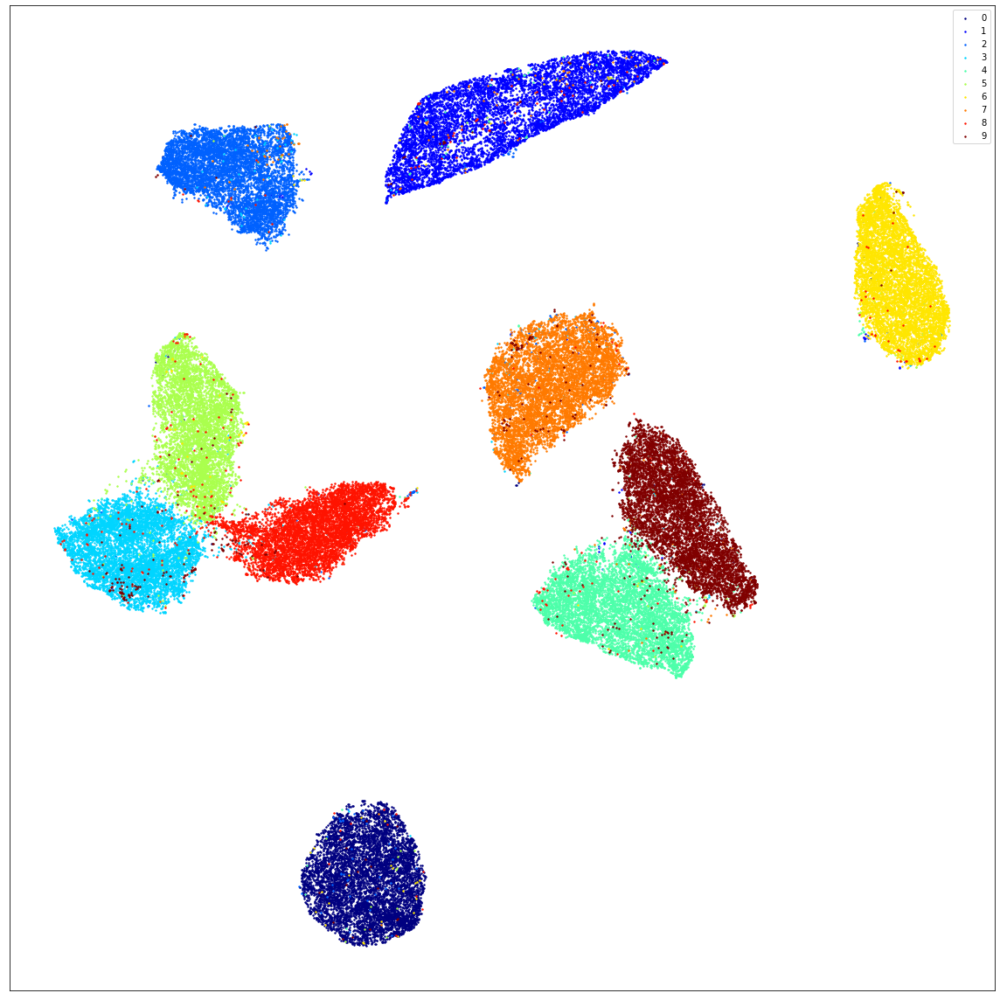

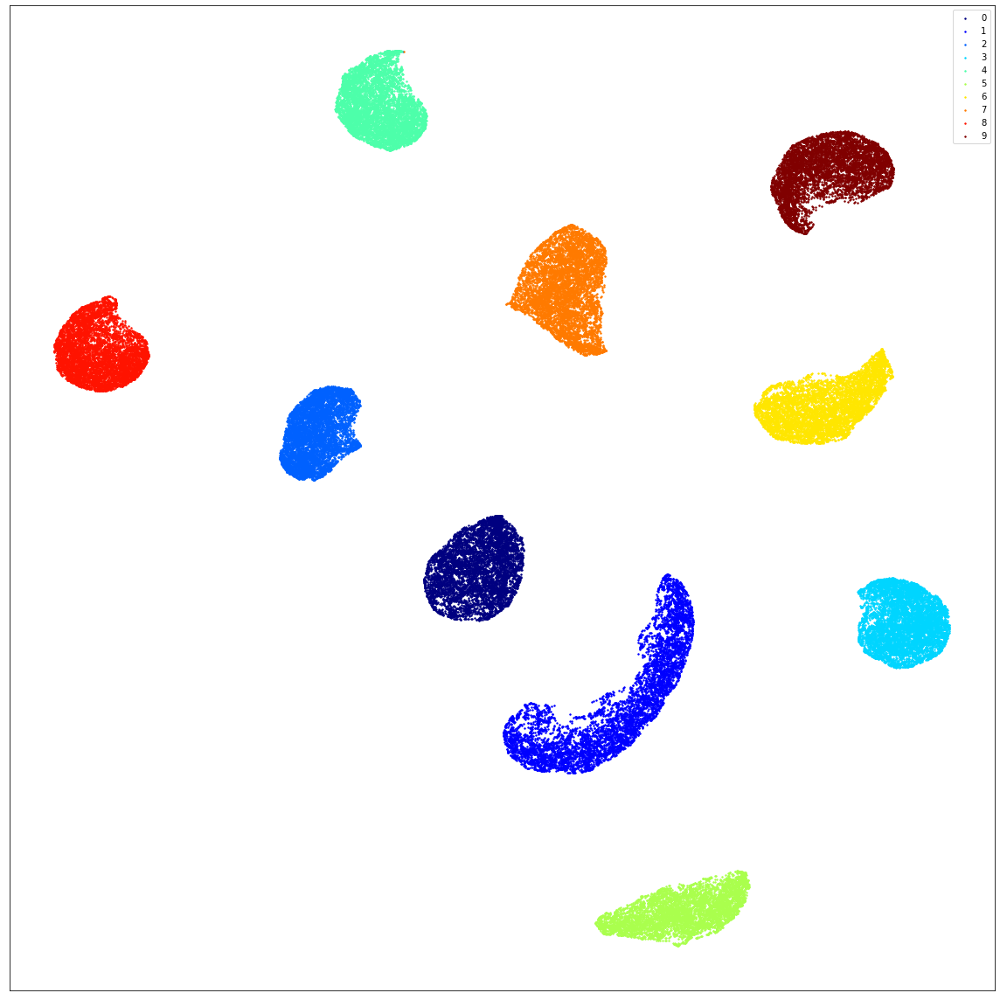

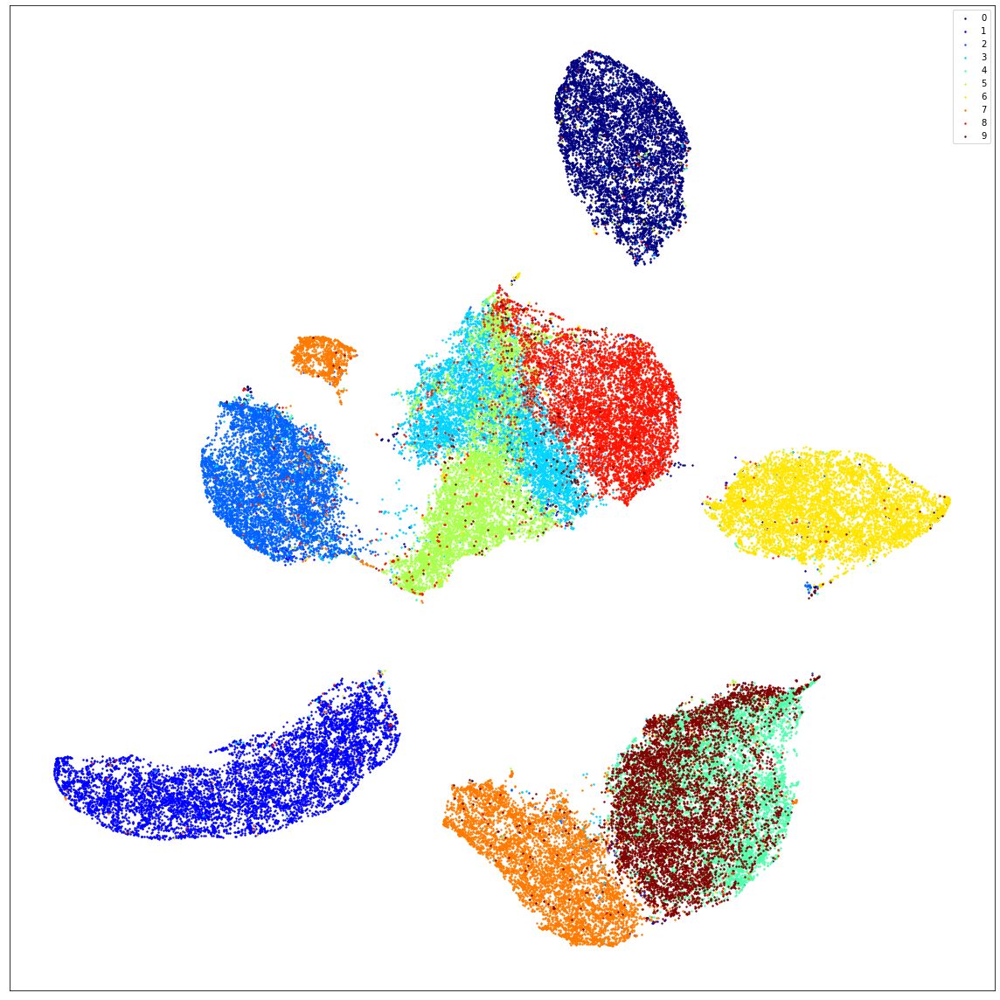

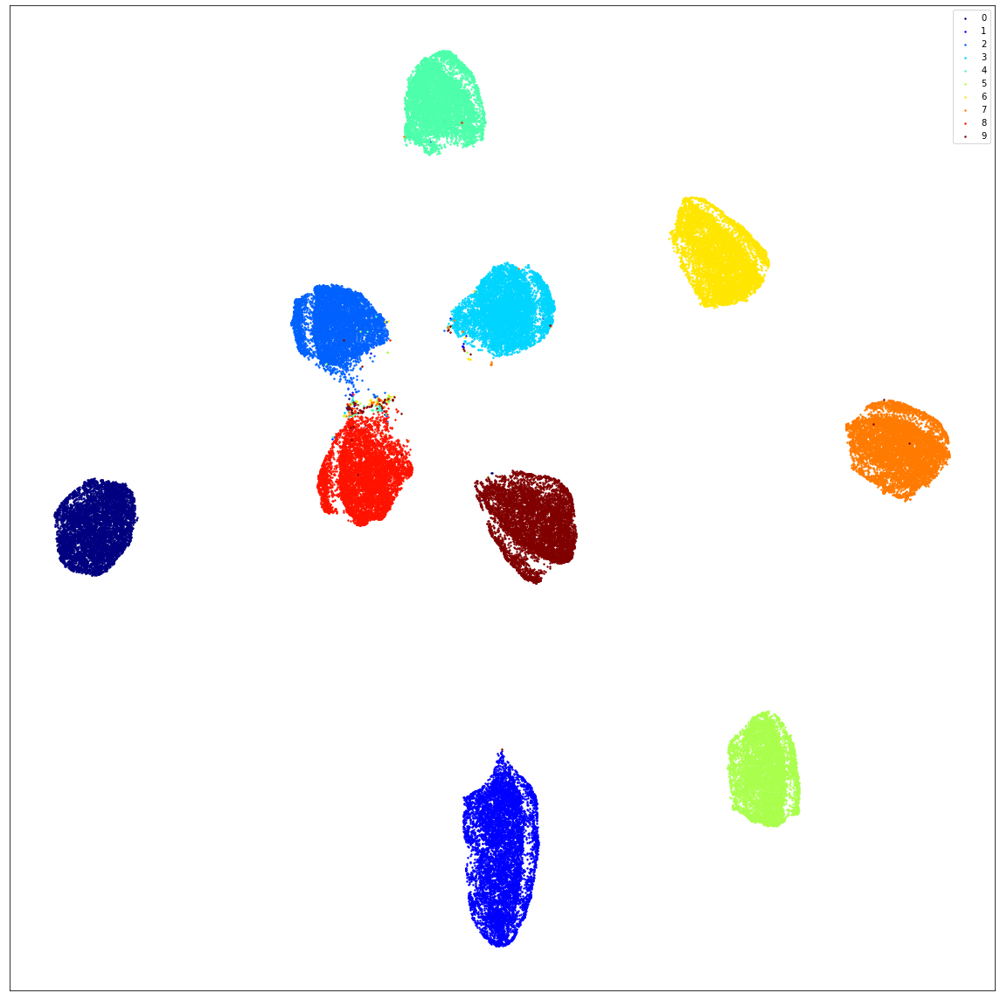

In [25]:
i = 0
for largevis_result in largevis_results:
    if "lc" in largevis_names[i]:
        plot_2d_scatter(largevis_result[:,0], largevis_result[:,1], labels_color)
    else:
        plot_2d_scatter(largevis_result[:,0], largevis_result[:,1], labels.to_numpy().flatten())
    i += 1

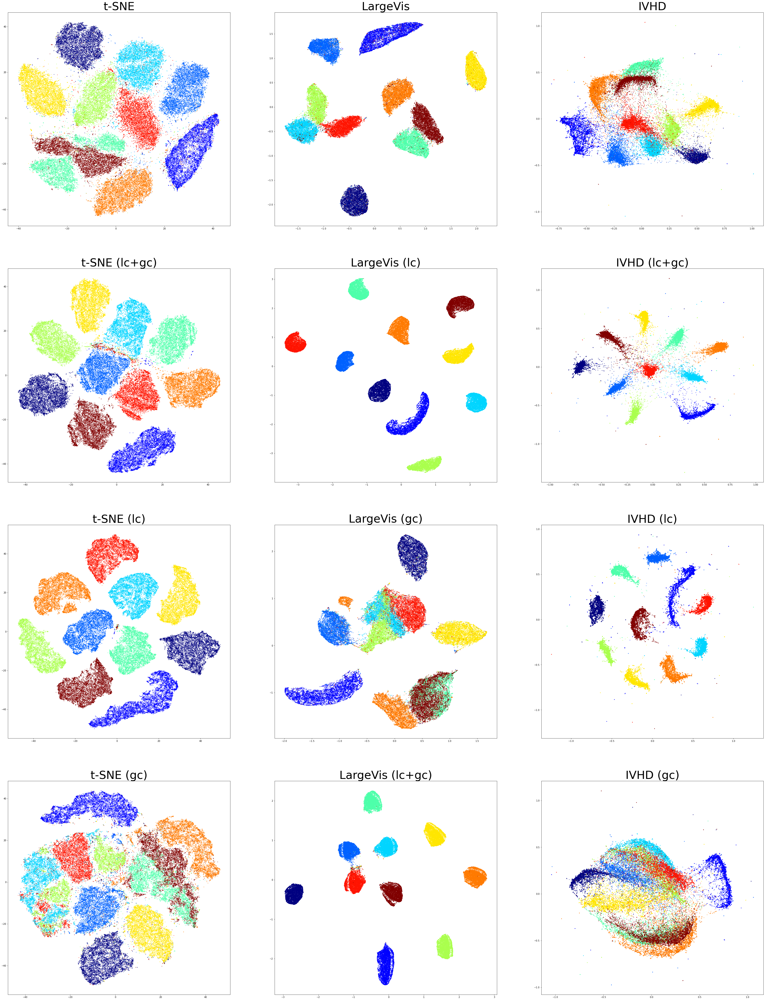

In [30]:
figure, axis = plt.subplots(4, 3)
figure.set_size_inches(60,80)

methods_names = [
    ["t-SNE", "t-SNE (lc+gc)", "t-SNE (lc)", "t-SNE (gc)"],
    ["LargeVis", "LargeVis (lc)", "LargeVis (gc)", "LargeVis (lc+gc)"],
    ["IVHD", "IVHD (lc+gc)", "IVHD (lc)", "IVHD (gc)"],
]

methods_results = [
    [tsne_embedded, merged_cluster_tsne, class_tsne, global_cluster_tsne],
    [largevis_results[0], largevis_results[1], largevis_results[2], largevis_results[3]],
    [ivhd_results[0], ivhd_results[3], ivhd_results[1], ivhd_results[2]],
]

labels_for_plot = labels.to_numpy().flatten()
unique = list(set(labels_for_plot))
colors = [plt.cm.jet(float(i) / max(unique)) for i in unique]

for j in range(3):
    for i in range(4):
        axis[i, j].set_title(methods_names[j][i], fontsize=50)

        X = methods_results[j][i][:, 0]
        Y = methods_results[j][i][:, 1]

        if "lc" in methods_names[j][i]:
            labels_for_plot = labels_color
        else:
            labels_for_plot = labels.to_numpy().flatten()

        for k, u in enumerate(unique):
            xi = [X[j] for j in range(len(X)) if labels_for_plot[j] == u]
            yi = [Y[j] for j in range(len(X)) if labels_for_plot[j] == u]
            axis[i, j].scatter(xi, yi, color=colors[k], label=str(u), alpha=0.8, s=2)

plt.show()

In [27]:
import numba
import random

from scipy.spatial.distance import squareform, pdist
from sklearn.model_selection import train_test_split

markers = ["x", "o", "s", "*", "^", ".", "X"]
colors = ["red", "blue", "green", "brown", "orange", "cyan", "grey", "purple"]


@numba.jit(nopython=True)
def knngain(d_hd, d_ld, labels):
    # Number of data points
    N = d_hd.shape[0]
    N_1 = N - 1
    k_hd = np.zeros(shape=N_1, dtype=np.int64)
    k_ld = np.zeros(shape=N_1, dtype=np.int64)
    # For each data point
    for i in range(N):
        c_i = labels[i]
        di_hd = d_hd[i, :].argsort(kind="mergesort")
        di_ld = d_ld[i, :].argsort(kind="mergesort")
        # Making sure that i is first in di_hd and di_ld
        for arr in [di_hd, di_ld]:
            for idj, j in enumerate(arr):
                if j == i:
                    idi = idj
                    break
            if idi != 0:
                arr[idi] = arr[0]
            arr = arr[1:]
        for k in range(N_1):
            if c_i == labels[di_hd[k]]:
                k_hd[k] += 1
            if c_i == labels[di_ld[k]]:
                k_ld[k] += 1
    # Computing the KNN gain
    gn = (k_ld.cumsum() - k_hd.cumsum()).astype(np.float64) / (
        (1.0 + np.arange(N_1)) * N
    )
    # Returning the KNN gain and its AUC
    return gn, eval_auc(gn)


@numba.jit(nopython=True)
def eval_auc(arr):
    i_all_k = 1.0 / (np.arange(arr.size) + 1.0)
    return np.float64(arr.dot(i_all_k)) / (i_all_k.sum())


@numba.jit(nopython=True)
def eval_rnx(Q):
    N_1 = Q.shape[0]
    N = N_1 + 1
    # Computing Q_NX
    qnxk = np.empty(shape=N_1, dtype=np.float64)
    acc_q = 0.0
    for K in range(N_1):
        acc_q += Q[K, K] + np.sum(Q[K, :K]) + np.sum(Q[:K, K])
        qnxk[K] = acc_q / ((K + 1) * N)
    # Computing R_NX
    arr_K = np.arange(N_1)[1:].astype(np.float64)
    rnxk = (N_1 * qnxk[: N_1 - 1] - arr_K) / (N_1 - arr_K)
    # Returning
    return rnxk


def eval_dr_quality(d_hd, d_ld):
    # Computing the co-ranking matrix of the embedding, and the R_{NX}(K) curve.
    rnxk = eval_rnx(Q=coranking(d_hd=d_hd, d_ld=d_ld))
    # Computing the AUC, and returning.
    return rnxk, eval_auc(rnxk)


def coranking(d_hd, d_ld):
    # Computing the permutations to sort the rows of the distance matrices in HDS and LDS.
    perm_hd = d_hd.argsort(axis=-1, kind="mergesort")
    perm_ld = d_ld.argsort(axis=-1, kind="mergesort")

    N = d_hd.shape[0]
    i = np.arange(N, dtype=np.int64)
    # Computing the ranks in the LDS
    R = np.empty(shape=(N, N), dtype=np.int64)
    for j in range(N):
        R[perm_ld[j, i], j] = i
    # Computing the co-ranking matrix
    Q = np.zeros(shape=(N, N), dtype=np.int64)
    for j in range(N):
        Q[i, R[perm_hd[j, i], j]] += 1
    # Returning
    return Q[1:, 1:]


def viz_qa(
    Ly,
    ymin=None,
    ymax=None,
    Lmarkers=None,
    Lcols=None,
    Lleg=None,
    Lls=None,
    Lmedw=None,
    Lsdots=None,
    lw=2,
    markevery=0.1,
    tit="",
    folder_name="",
    xlabel="",
    ylabel="",
    alpha_plot=0.9,
    alpha_leg=0.8,
    stit=25,
    sax=20,
    sleg=15,
    zleg=1,
    loc_leg="best",
    ncol_leg=1,
    lMticks=10,
    lmticks=5,
    wMticks=2,
    wmticks=1,
    nyMticks=11,
    mymticks=4,
    grid=True,
    grid_ls="solid",
    grid_col="lightgrey",
    grid_alpha=0.7,
    xlog=True,
):
    # Number of curves
    nc = len(Ly)
    # Checking the parameters
    if ymin is None:
        ymin = np.min(np.asarray([arr.min() for arr in Ly]))
    if ymax is None:
        ymax = np.max(np.asarray([arr.max() for arr in Ly]))
    if Lmarkers is None:
        Lmarkers = ["x"] * nc
    if Lcols is None:
        Lcols = ["blue"] * nc
    if Lleg is None:
        Lleg = [None] * nc
        add_leg = False
    else:
        add_leg = True
    if Lls is None:
        Lls = ["solid"] * nc
    if Lmedw is None:
        Lmedw = [float(lw) / 2.0] * nc
    if Lsdots is None:
        Lsdots = [12] * nc

    # Setting the limits of the y-axis
    y_lim = [ymin, ymax]

    # Defining the ticks on the y-axis
    yMticks = np.linspace(
        start=ymin, stop=ymax, num=nyMticks, endpoint=True, retstep=False
    )
    ymticks = np.linspace(
        start=ymin,
        stop=ymax,
        num=1 + mymticks * (nyMticks - 1),
        endpoint=True,
        retstep=False,
    )
    yMticksLab = [int(round(v * 100.0)) / 100.0 for v in yMticks]

    # Initial values for xmin and xmax
    xmin, xmax = 1, -np.inf

    fig = plt.figure(figsize=(16, 12))
    ax = fig.add_subplot(111)
    if xlog:
        fplot = ax.semilogx
    else:
        fplot = ax.plot

    # Plotting the data
    for id, y in enumerate(Ly):
        x = np.arange(start=1, step=1, stop=y.size + 0.5, dtype=np.int64)
        xmax = max(xmax, x[-1])
        fplot(
            x,
            y,
            label=Lleg[id],
            alpha=alpha_plot,
            color=Lcols[id],
            linestyle=Lls[id],
            lw=lw,
            marker=Lmarkers[id],
            markeredgecolor=Lcols[id],
            markeredgewidth=Lmedw[id],
            markersize=Lsdots[id],
            dash_capstyle="round",
            solid_capstyle="round",
            dash_joinstyle="round",
            solid_joinstyle="round",
            markerfacecolor=Lcols[id],
            markevery=markevery,
        )

    # Setting the limits of the axes
    ax.set_xlim([xmin, xmax])
    ax.set_ylim(y_lim)

    # Setting the major and minor ticks on the y-axis
    ax.set_yticks(yMticks, minor=False)
    ax.set_yticks(ymticks, minor=True)
    ax.set_yticklabels(yMticksLab, minor=False, fontsize=sax)

    # Defining the legend
    if add_leg:
        leg = ax.legend(
            loc=loc_leg,
            fontsize=sleg,
            markerfirst=True,
            fancybox=True,
            framealpha=alpha_leg,
            ncol=ncol_leg,
        )
        if zleg is not None:
            leg.set_zorder(zleg)

    # Setting the size of the ticks labels on the x axis
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(sax)

    # Setting ticks length and width
    ax.tick_params(axis="both", length=lMticks, width=wMticks, which="major")
    ax.tick_params(axis="both", length=lmticks, width=wmticks, which="minor")

    # Setting the positions of the labels
    ax.xaxis.set_tick_params(labelright=False, labelleft=True)
    ax.yaxis.set_tick_params(labelright=False, labelleft=True)

    # Adding the grids
    if grid:
        ax.xaxis.grid(
            True, linestyle=grid_ls, which="major", color=grid_col, alpha=grid_alpha
        )
        ax.yaxis.grid(
            True, linestyle=grid_ls, which="major", color=grid_col, alpha=grid_alpha
        )
    ax.set_axisbelow(True)

    ax.set_title(tit, fontsize=stit)
    ax.set_xlabel(xlabel, fontsize=sax)
    ax.set_ylabel(ylabel, fontsize=sax)
    # plt.tight_layout()

    # Showing the figure
    fig.savefig(
        "{}.png".format(
            tit
        ),
        dpi=fig.dpi,
    )


class LocalMetric:
    def __init__(self):
        self.L_rnx = []
        self.L_kg = []
        self.Lleg_rnx = []
        self.Lleg_kg = []
        self.Lls = []
        self.number_of_methods = 0

    def calculate_knn_gain_and_dr_quality(
        self,
        X_lds: np.ndarray,
        X_hds: np.ndarray,
        labels: np.ndarray,
        method_name: str,
    ):

        (
            X_hds_train,
            X_hds_test,
            X_lds_train,
            X_lds_test,
            labels_train,
            labels_test,
        ) = train_test_split(X_hds, X_lds, labels, test_size=0.15)

        print("Calculating d_hd")
        d_hd = squareform(X=pdist(X=X_hds_test, metric="euclidean"), force="tomatrix")

        print(method_name)
        d_ld = squareform(X=pdist(X=X_lds_test, metric="euclidean"), force="tomatrix")
        rnxk, auc_rnx = eval_dr_quality(d_hd=d_hd, d_ld=d_ld)
        kg, auc_kg = knngain(d_hd=d_hd, d_ld=d_ld, labels=labels_test)

        self.L_rnx.append(rnxk)
        self.L_kg.append(kg)
        self.Lleg_rnx.append(
            "{} {}".format(int(round(auc_rnx * 1000)) / 1000.0, method_name)
        )
        self.Lleg_kg.append(
            "{} {}".format(int(round(auc_kg * 1000)) / 1000.0, method_name)
        )
        self.Lls.append("solid")
        self.number_of_methods = self.number_of_methods + 1

    def visualize(self):
        Lmarkers = random.sample(markers, self.number_of_methods)
        Lcols = random.sample(colors, self.number_of_methods)
        Lmedw = [1.0] * self.number_of_methods
        Lsdots = [12] * self.number_of_methods

        viz_qa(
            Ly=self.L_rnx,
            Lmarkers=Lmarkers,
            Lcols=Lcols,
            Lleg=self.Lleg_rnx,
            Lls=self.Lls,
            Lmedw=Lmedw,
            Lsdots=Lsdots,
            tit="DR quality",
            xlabel="Neighborhood size $K$",
            ylabel="$R_{NX}(K)$",
        )

        viz_qa(
            Ly=self.L_kg,
            Lmarkers=Lmarkers,
            Lcols=Lcols,
            Lleg=self.Lleg_kg,
            Lls=self.Lls,
            Lmedw=Lmedw,
            Lsdots=Lsdots,
            tit="KNN gain",
            xlabel="Neighborhood size $K$",
            ylabel="$G_{NN}(K)$",
        )

        print("Finished.")

Calculating d_hd
t-SNE
Calculating d_hd
t-SNE (lc)
Calculating d_hd
t-SNE (gc)
Calculating d_hd
t-SNE (lc+gc)
Finished.


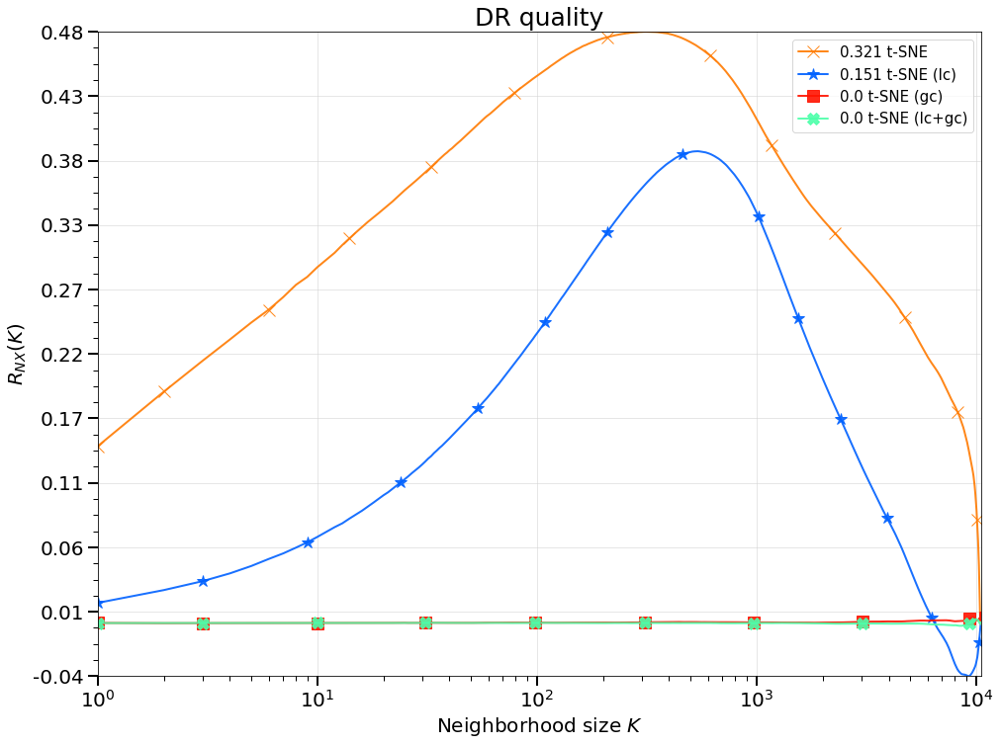

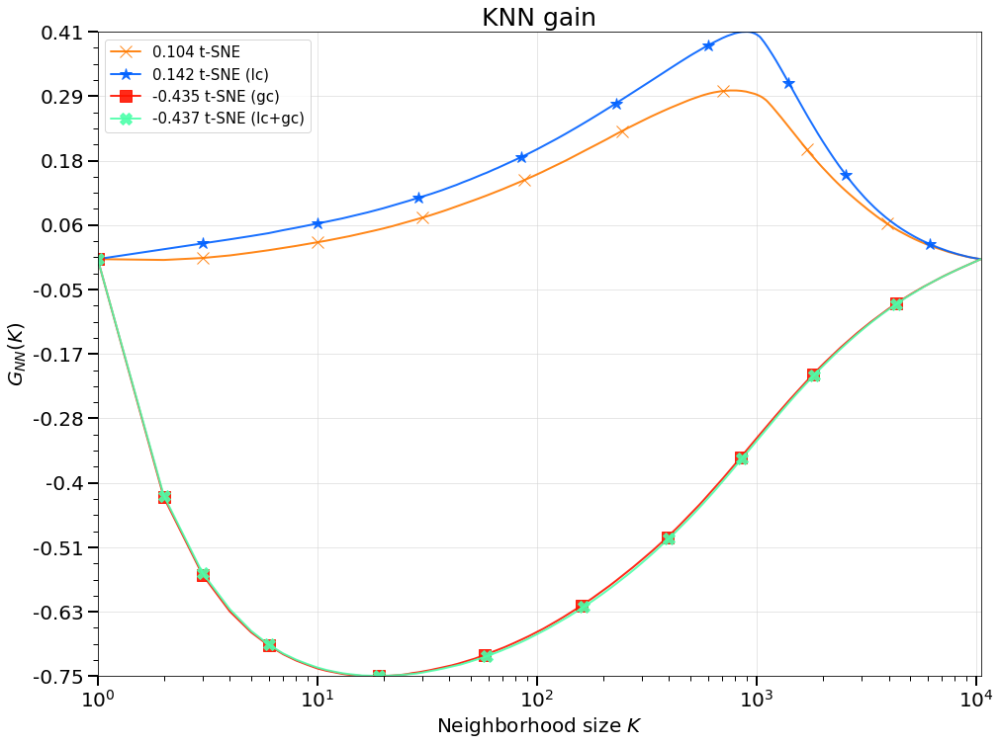

In [33]:
overall_metrics = LocalMetric()

embeddings = [tsne_embedded, merged_cluster_tsne, class_tsne, global_cluster_tsne]
methods = ["t-SNE", "t-SNE (lc)", "t-SNE (gc)","t-SNE (lc+gc)"]

def metric_calculate(metric, embedding, method_names):
    for i in range(len(embedding)):
        metric.calculate_knn_gain_and_dr_quality(
            X_lds=embedding[i],
            X_hds=dataset_sorted_by_local if "lc" in method_names[i] else dataset,
            labels=labels_color if "lc" in method_names[i] else labels.to_numpy(),
            method_name=method_names[i],
        )

metric_calculate(overall_metrics, embeddings, methods)

overall_metrics.visualize()

In [31]:
overall_metrics = LocalMetric()

embeddings = [ivhd_results[0], ivhd_results[1], ivhd_results[2], ivhd_results[3]]
methods = ["IVHD", "IVHD (lc)", "IVHD (gc)","IVHD (lc+gc)"]

def metric_calculate(metric, embedding, method_names):
    for i in range(len(embedding)):
        metric.calculate_knn_gain_and_dr_quality(
            X_lds=embedding[i],
            X_hds=dataset_sorted_by_local if "lc" in method_names[i] else dataset,
            labels=labels_color if "lc" in method_names[i] else labels.to_numpy(),
            method_name=method_names[i],
        )

metric_calculate(overall_metrics, embeddings, methods)

Calculating d_hd
IVHD
Calculating d_hd
IVHD (lc)
Calculating d_hd
IVHD (gc)
Calculating d_hd
IVHD (lc+gc)


Finished.


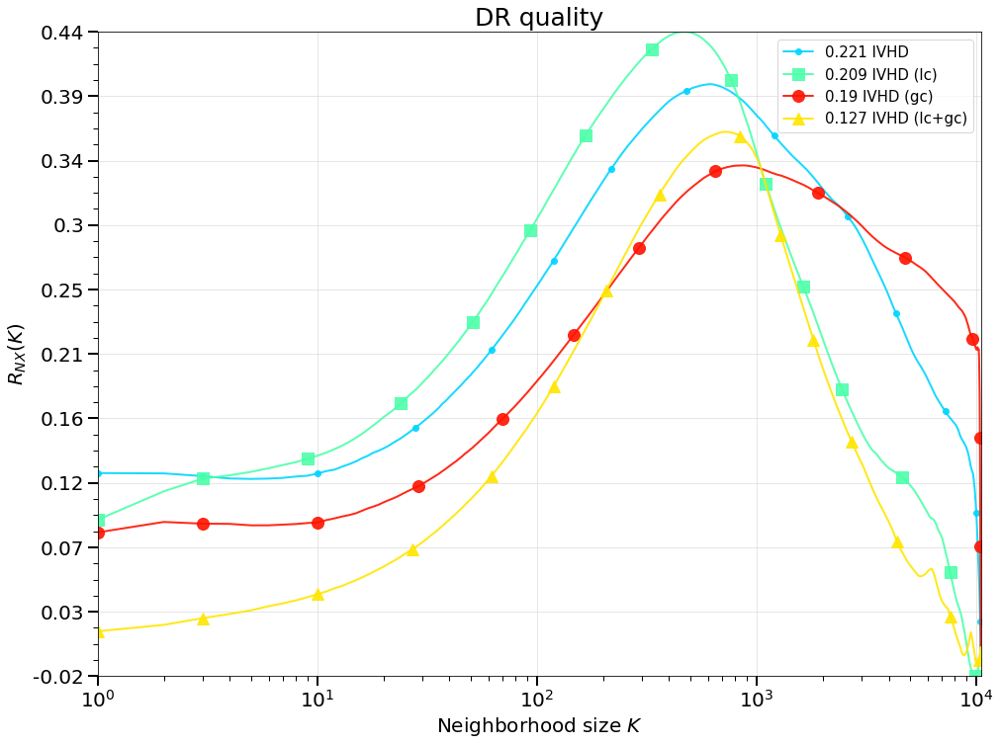

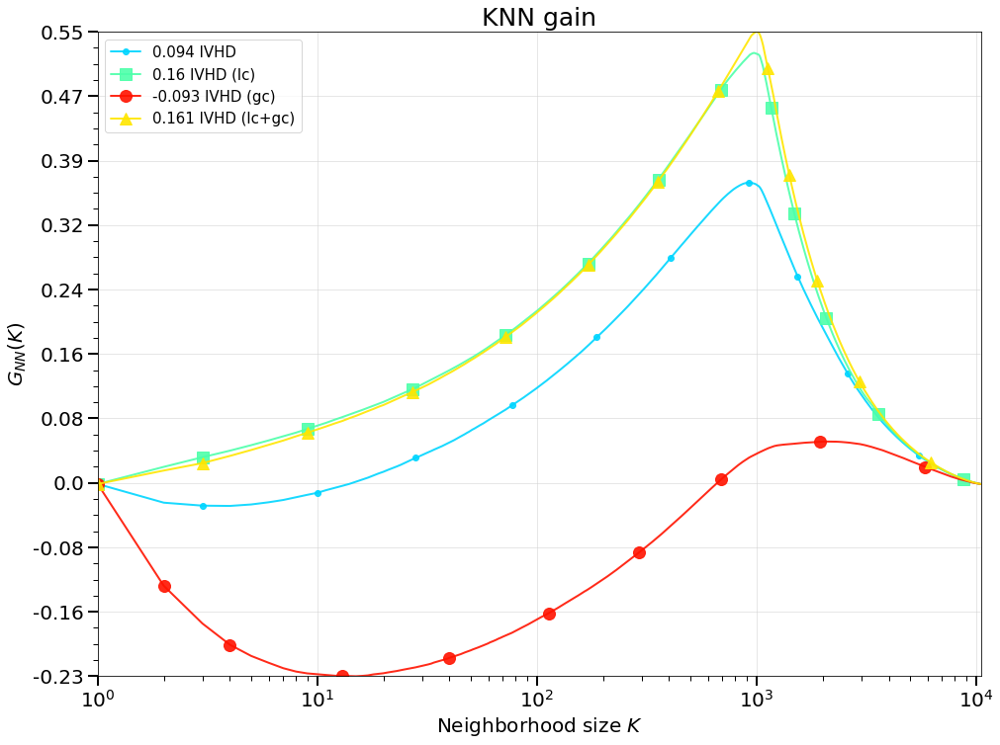

In [32]:
overall_metrics.visualize()

Calculating d_hd
LargeVis
Calculating d_hd
LargeVis (lc)
Calculating d_hd
LargeVis (gc)
Calculating d_hd
LargeVis (lc+gc)
Finished.


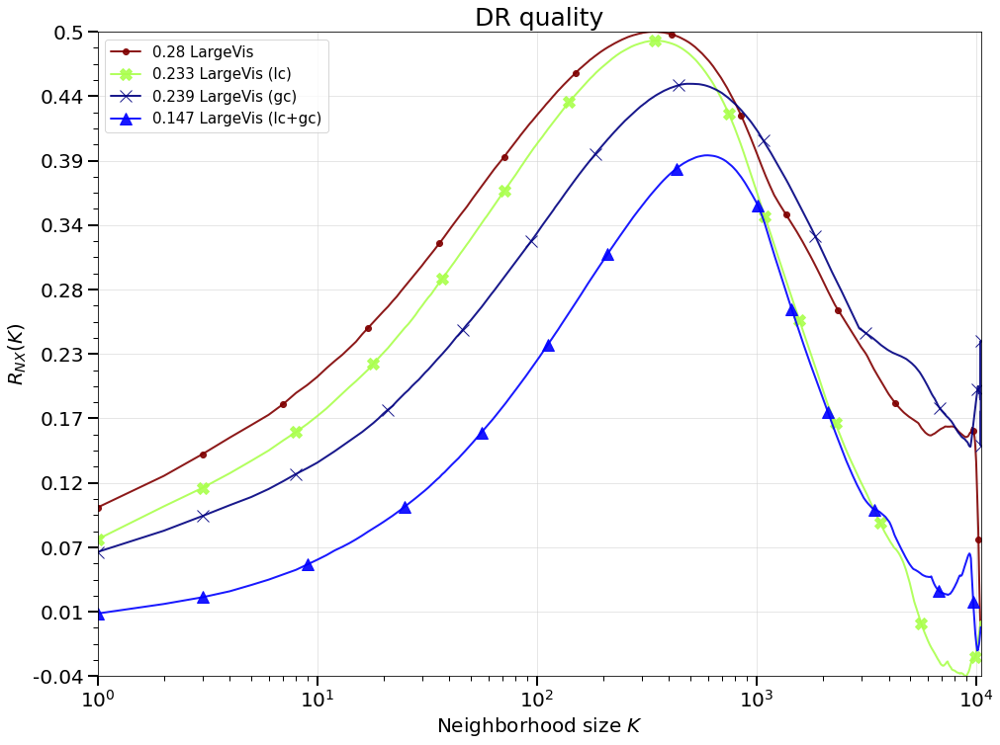

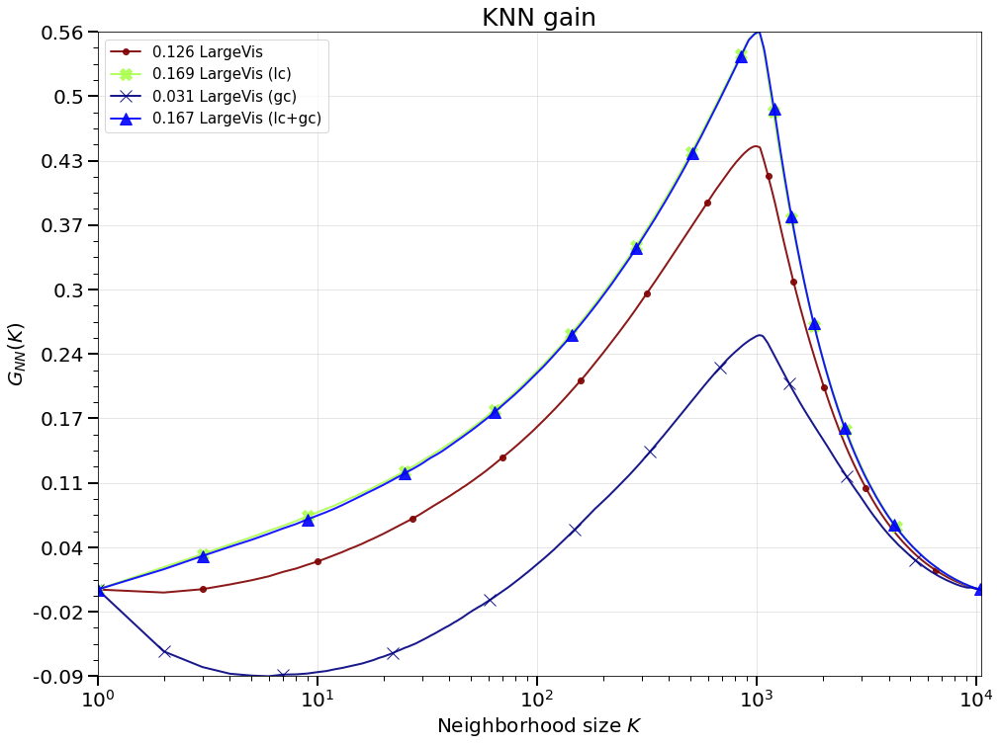

In [34]:
overall_metrics = LocalMetric()

embeddings = [largevis_results[0], largevis_results[1], largevis_results[2], largevis_results[3]]
methods = ["LargeVis", "LargeVis (lc)", "LargeVis (gc)","LargeVis (lc+gc)"]

def metric_calculate(metric, embedding, method_names):
    for i in range(len(embedding)):
        metric.calculate_knn_gain_and_dr_quality(
            X_lds=embedding[i],
            X_hds=dataset_sorted_by_local if "lc" in method_names[i] else dataset,
            labels=labels_color if "lc" in method_names[i] else labels.to_numpy(),
            method_name=method_names[i],
        )

metric_calculate(overall_metrics, embeddings, methods)

overall_metrics.visualize()